In [1]:
# System imports
import os
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import hvplot.pandas
import panel as pn
from pathlib import Path
from dotenv import load_dotenv
from panel.interact import interact
from panel import widgets
from string import digits
import csv
import json
import numpy as np
import dateparser
import panel as pn

pn.extension()

%matplotlib inline

In [2]:
# Local imports
import sys
sys.path.append("../lib2")

from Constants import Constants
from ProcessingTools import DateProcessingTools
from MCForecastTools_Generic import MCSimulation_Generic


In [3]:
# Construct the tools
debug_level = 0
constants = Constants()
tool_data_processing = DateProcessingTools(debug_level)


In [4]:
# Import all preprocessed data
atlas           = pd.read_pickle(constants.PREPROCESSED_ATLAS_FILE_PATH)
forecast        = pd.read_pickle(constants.PREPROCESSED_FORECAST_DATA_FILE_PATH)
revenue2020     = pd.read_pickle(constants.PREPROCESSED_REVENUE2020_FILE_PATH)
revenue2020A    = pd.read_pickle(constants.PREPROCESSED_REVENUE2020A_FILE_PATH)
atlas2          = pd.read_pickle(constants.PREPROCESSED_ATLAS_2_FILE_PATH)


In [5]:
historical_data = atlas2.reset_index().set_index("Service Start").sort_index(ascending=True)

historical_data_invoice_amount = historical_data.groupby("Service Start").sum()["Invoice Amount"]
historical_data_invoice_count = historical_data.groupby("Service Start").count()["Invoice Amount"]

# Critical
historical_data_invoice_amount_cumulative = historical_data_invoice_amount.cumsum()
historical_data_invoice_count_cumulative = historical_data_invoice_count.cumsum()

# Extra
historical_data_invoice_mean = historical_data.groupby("Service Start").mean()["Invoice Amount"]
historical_data_nbr_users = historical_data.groupby("Service Start").sum()["Number of Users"]
historical_data_nbr_customers = historical_data.groupby("Service Start").count()["Customers"]

historical_data_nbr_users_cumulative = historical_data_nbr_users.cumsum()
historical_data_nbr_customers_cumulative = historical_data_nbr_customers.cumsum()


In [6]:
mc = MCSimulation_Generic(
    value_title="Invoice Amount",
    value_list = historical_data_invoice_amount_cumulative,
    num_simulation=1000,
    num_trailing_points = 10,
    scale_results=True,
    allow_negative_returns = True
)

mc.calc_cumulative_return()


Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.138889,1.138889,1.138889,1.138889,1.138889,1.138889,1.138889,1.138889,1.138889,1.138889,...,1.138889,1.138889,1.138889,1.138889,1.138889,1.138889,1.138889,1.138889,1.138889,1.138889
2,1.187500,1.187500,1.187500,1.187500,1.187500,1.187500,1.187500,1.187500,1.187500,1.187500,...,1.187500,1.187500,1.187500,1.187500,1.187500,1.187500,1.187500,1.187500,1.187500,1.187500
3,1.801389,1.801389,1.801389,1.801389,1.801389,1.801389,1.801389,1.801389,1.801389,1.801389,...,1.801389,1.801389,1.801389,1.801389,1.801389,1.801389,1.801389,1.801389,1.801389,1.801389
4,1.848611,1.848611,1.848611,1.848611,1.848611,1.848611,1.848611,1.848611,1.848611,1.848611,...,1.848611,1.848611,1.848611,1.848611,1.848611,1.848611,1.848611,1.848611,1.848611,1.848611
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
272,30.944580,37.186244,37.927984,39.476231,33.751700,37.770412,31.508245,34.124089,37.173230,34.055590,...,33.439463,39.003471,30.146613,34.682352,35.780173,37.385162,29.554290,30.944524,31.838040,35.971857
273,31.732349,35.735335,42.365661,38.590581,34.412265,36.203462,32.667502,35.811383,35.089108,33.333985,...,35.911192,36.153065,29.087377,38.553192,37.447105,37.991203,28.084612,33.175734,31.453738,38.043051
274,30.719438,35.694976,44.096918,38.776820,33.884473,37.691786,33.720646,38.193106,35.861831,32.723941,...,39.379559,38.344667,31.186431,38.591320,38.923626,38.689270,27.244185,31.465972,32.069996,41.527175
275,30.301572,36.084295,44.177028,38.192832,34.739620,38.060384,35.348935,36.815979,36.472131,34.684962,...,39.408877,41.089247,33.389499,38.139650,39.627016,41.474138,28.392321,32.548498,32.332946,45.253817


In [7]:
mc.plot_simulation()

:NdOverlay   [Variable]
   :Curve   [index]   (value)

<AxesSubplot:title={'center':'Distribution of Final Cumuluative Invoice Amount Across All 1000 Simulations'}, ylabel='Frequency'>

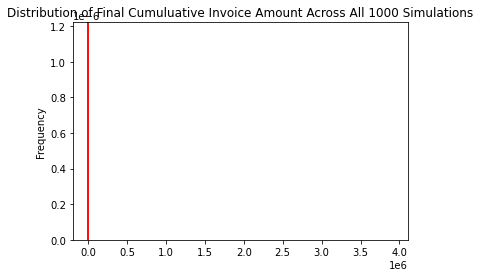

In [8]:
mc.plot_distribution()
# mc.simulated_return.iloc[-1, :]
# mc.simulated_return.iloc[-1, :].plot(kind='hist', title="")
# mc.simulated_return.iloc[-1, :].plot(kind='hist', bins=10, density=True, title="", height=500, width=800)


In [9]:
mc.summarize_cumulative_return()

count           1.000000e+03
mean            2.611014e+06
std             3.541722e+05
min             1.650873e+06
25%             2.368307e+06
50%             2.596960e+06
75%             2.821087e+06
max             3.910839e+06
95% CI Lower    2.767568e+01
95% CI Upper    4.655171e+01
Name: 276, dtype: float64

In [10]:
df = pd.concat([historical_data_invoice_amount_cumulative, historical_data_invoice_count_cumulative], axis="columns", join="inner")
df.columns=["Invoice Amount ($)", "Nbr. of Invoices"]
df.hvplot.line()

:NdOverlay   [Variable]
   :Curve   [Service Start]   (value)

In [11]:
historical_data_invoice_amount_cumulative.hvplot.line(ylabel="Invoice Amount ($)")

:Curve   [Service Start]   (Invoice Amount)

In [12]:
historical_data_invoice_count_cumulative.hvplot.line(ylabel="Nbr. Invoices")

:Curve   [Service Start]   (Invoice Amount)

In [13]:
historical_data_nbr_users_cumulative.hvplot.line()

:Curve   [Service Start]   (Number of Users)

In [14]:
historical_data_nbr_customers_cumulative.hvplot.line()

:Curve   [Service Start]   (Customers)